In [1]:
import numpy as np
import matplotlib.pyplot as plt
  
import torch
import torch.nn as nn
import numpy as np
from copy import deepcopy

In [2]:
clstm_morning = np.load('clstm_morning.npy')
clstm_evening = np.load('clstm_evening.npy')
clstm_afternoon = np.load('clstm_afternoon.npy')

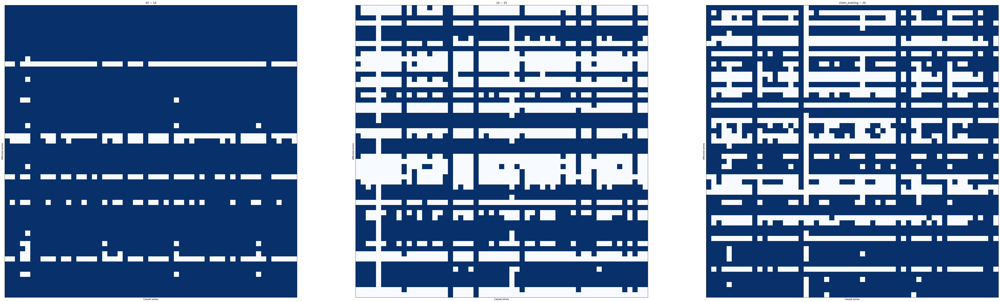

In [3]:
# Make figures
fig, axarr = plt.subplots(1, 3, figsize=(80, 40))
axarr[0].imshow(clstm_morning, cmap='Blues')
axarr[0].set_title('05 ~ 10')
axarr[0].set_ylabel('Affected series')
axarr[0].set_xlabel('Causal series')
axarr[0].set_xticks([])
axarr[0].set_yticks([])

axarr[1].set_title('10 ~ 15')
axarr[1].imshow(clstm_afternoon, cmap='Blues', vmin=0, vmax=1, extent=(0, len(clstm_afternoon), len(clstm_afternoon), 0))
axarr[1].set_ylabel('Affected series')
axarr[1].set_xlabel('Causal series')
axarr[1].set_xticks([])
axarr[1].set_yticks([])

axarr[2].set_title('clstm_evening ~ 20')
axarr[2].imshow(clstm_evening, cmap='Blues', vmin=0, vmax=1, extent=(0, len(clstm_evening), len(clstm_evening), 0))
axarr[2].set_ylabel('Affected series')
axarr[2].set_xlabel('Causal series')
axarr[2].set_xticks([])
axarr[2].set_yticks([])


plt.show()

In [4]:
import pandas as pd

In [5]:
road = pd.read_csv('road_gang.csv')

In [6]:
road_name = road.columns

In [7]:
clstm_causality_morning = pd.DataFrame(columns = ['cause','effect'])

In [8]:
for i in range(57):
    for j in range(57):
        if clstm_morning[i][j] == 1:
            cause, effect = int(road_name[i]), int(road_name[j])
            clstm_causality_morning = clstm_causality_morning.append({'cause': cause, 'effect':effect},ignore_index = True)

In [9]:
clstm_causality_morning

,cause,effect
0,1220029700,1220029700
1,1220029700,1220032100
2,1220029700,1220033000
3,1220029700,1220024600
4,1220029700,1220028200
...,...,...
2983,1220026800,1220033300
2984,1220026800,1220031000
2985,1220026800,1220034600
2986,1220026800,1220032800


In [10]:
map_info = pd.read_excel('C:/Users/chanyoung/Desktop/id_info.xlsx')

<ipython-input-10-5ddba9f1d02e>:1: FutureWarning: Your version of xlrd is 1.2.0. In xlrd >= 2.0, only the xls format is supported. As a result, the openpyxl engine will be used if it is installed and the engine argument is not specified. Install openpyxl instead.
  map_info = pd.read_excel('C:/Users/chanyoung/Desktop/id_info.xlsx')


In [11]:
import folium

In [12]:
m = folium.Map(location=[map_info[map_info['링크아이디'] == 1220029700]['latitude'].values[0],
                         map_info[map_info['링크아이디'] == 1220029700]['longitude'].values[0]], width=750, height=500)

for i in range(len(clstm_causality_morning)):
    
    # cause road
    cause_latitude = map_info[map_info['링크아이디'] == clstm_causality_morning['cause'][i]]['latitude'].values[0]
    cause_logtitude = map_info[map_info['링크아이디'] == clstm_causality_morning['cause'][i]]['longitude'].values[0]
    folium.CircleMarker([cause_latitude, cause_logtitude],
                        radius=10,
                        color='red',
                        fill_color='#fffggg').add_to(m)
    
    # effect road
    effect_latitude = map_info[map_info['링크아이디'] == clstm_causality_morning['effect'][i]]['latitude'].values[0]
    effect_logtitude = map_info[map_info['링크아이디'] == clstm_causality_morning['effect'][i]]['longitude'].values[0]
    folium.CircleMarker([effect_latitude, effect_logtitude],
                        radius=10,
                        color='red',
                        fill_color='#fffggg').add_to(m)
    
    # cause-effect line
    folium.PolyLine([[cause_latitude,cause_logtitude], [effect_latitude, effect_logtitude]]).add_to(m)

m

In [13]:
clstm_causality_evening = pd.DataFrame(columns = ['cause','effect'])
clstm_causality_afternoon = pd.DataFrame(columns = ['cause','effect'])
for i in range(57):
    for j in range(57):
        if clstm_evening[i][j] == 1:
            cause, effect = int(road_name[i]), int(road_name[j])
            clstm_causality_evening = clstm_causality_evening.append({'cause': cause, 'effect':effect},ignore_index = True)

for i in range(57):
    for j in range(57):
        if clstm_afternoon[i][j] == 1:
            cause, effect = int(road_name[i]), int(road_name[j])
            clstm_causality_afternoon = clstm_causality_afternoon.append({'cause': cause, 'effect':effect},ignore_index = True)

In [14]:
m = folium.Map(location=[map_info[map_info['링크아이디'] == 1220029700]['latitude'].values[0],
                         map_info[map_info['링크아이디'] == 1220029700]['longitude'].values[0]], width=750, height=500)

for i in range(len(clstm_causality_afternoon)):
    
    # cause road
    cause_latitude = map_info[map_info['링크아이디'] == clstm_causality_afternoon['cause'][i]]['latitude'].values[0]
    cause_logtitude = map_info[map_info['링크아이디'] == clstm_causality_afternoon['cause'][i]]['longitude'].values[0]
    folium.CircleMarker([cause_latitude, cause_logtitude],
                        radius=10,
                        color='red',
                        fill_color='#fffggg').add_to(m)
    
    # effect road
    effect_latitude = map_info[map_info['링크아이디'] == clstm_causality_afternoon['effect'][i]]['latitude'].values[0]
    effect_logtitude = map_info[map_info['링크아이디'] == clstm_causality_afternoon['effect'][i]]['longitude'].values[0]
    folium.CircleMarker([effect_latitude, effect_logtitude],
                        radius=10,
                        color='red',
                        fill_color='#fffggg').add_to(m)
    
    # cause-effect line
    folium.PolyLine([[cause_latitude,cause_logtitude], [effect_latitude, effect_logtitude]]).add_to(m)

m

In [15]:
m = folium.Map(location=[map_info[map_info['링크아이디'] == 1220029700]['latitude'].values[0],
                         map_info[map_info['링크아이디'] == 1220029700]['longitude'].values[0]], width=750, height=500)

for i in range(len(clstm_causality_evening)):
    
    # cause road
    cause_latitude = map_info[map_info['링크아이디'] == clstm_causality_evening['cause'][i]]['latitude'].values[0]
    cause_logtitude = map_info[map_info['링크아이디'] == clstm_causality_evening['cause'][i]]['longitude'].values[0]
    folium.CircleMarker([cause_latitude, cause_logtitude],
                        radius=10,
                        color='red',
                        fill_color='#fffggg').add_to(m)
    
    # effect road
    effect_latitude = map_info[map_info['링크아이디'] == clstm_causality_evening['effect'][i]]['latitude'].values[0]
    effect_logtitude = map_info[map_info['링크아이디'] == clstm_causality_evening['effect'][i]]['longitude'].values[0]
    folium.CircleMarker([effect_latitude, effect_logtitude],
                        radius=10,
                        color='red',
                        fill_color='#fffggg').add_to(m)
    
    # cause-effect line
    folium.PolyLine([[cause_latitude,cause_logtitude], [effect_latitude, effect_logtitude]]).add_to(m)

m